In [1]:
%matplotlib inline

import pandas as pd
from sqlalchemy import create_engine
import os
from dotenv import load_dotenv
from datetime import datetime, timedelta
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from IPython.display import HTML, display
from matplotlib.colors import ListedColormap

import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine
from datetime import datetime
from dateutil.relativedelta import relativedelta
import pandas as pd
import matplotlib.pyplot as plt
from sqlalchemy import create_engine
from datetime import datetime
from dateutil.relativedelta import relativedelta
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import plotly.graph_objects as go

random_seed=1
np.random.seed(random_seed) #set random seed for deterministic results

pd.set_option('display.max_rows', 1000)
pd.options.display.float_format = '{:.2f}'.format
plt.style.use('ggplot') #print(plt.style.available)

#Qualitative ColorMap
qColorMap = plt.cm.tab20b

#Sequential ColorMap
sColorMap = plt.cm.viridis
#https://stackoverflow.com/questions/6541123/

#improve-subplot-size-spacing-with-many-subplots
plt.subplots_adjust(
    left = 0.1,#125, # the left side of the subplots of the figure
    right = 0.9, # the right side of the subplots of the figure
    bottom = 0.1, # the bottom of the subplots of the figure
    top = 0.9, # the top of the subplots of the figure
    wspace = 0.5, # the amount of width reserved for blank space between subplots
    hspace = 0.2 # the amount of height reserved for white space between subplots
)

#Constant to make the code more readable
ALLCORES = -1

<Figure size 640x480 with 0 Axes>

In [2]:
print ("Loading environment variables")
#Note you need to restart the kernel if these change
load_dotenv()

Loading environment variables


True

In [3]:
DATABASE_URL = os.getenv('DATABASE_URL')
engine = create_engine(DATABASE_URL)
print ("SQL Connection Established")

SQL Connection Established


In [4]:
CREATE_TITLE_SAMPLE = False
if CREATE_TITLE_SAMPLE:
    query = """
    SELECT 
    	title
    FROM hacker_news.items TABLESAMPLE SYSTEM (2)
    WHERE type = 'story'
    """
    
    df = pd.read_sql(query, engine)
    df.to_csv("hn_title_sample_2PC.csv", index=False)


In [5]:
query = """
    SELECT 
    	*
    FROM hacker_news.items TABLESAMPLE SYSTEM (0.01)
    """
    #WHERE type = 'story'

df = pd.read_sql(query, engine)

display(HTML(f"<b>hacker_news.items</b>"))
display(df.columns)
display(df.describe())
display(df.info())

Index(['id', 'dead', 'type', 'by', 'time', 'text', 'parent', 'kids', 'url',
       'score', 'title', 'descendants'],
      dtype='object')

,id,time,parent,score,descendants
count,4056.00,4048,3520.00,510.00,427.00
mean,20162984.49,2018-08-25 03:04:35.707756800,20823530.54,9.57,4.28
min,118934.00,2008-02-19 15:27:29,304280.00,1.00,-1.00
25%,10249738.75,2015-09-21 01:21:53.500000,11343335.50,1.00,0.00
50%,18627102.50,2018-12-07 12:33:58.500000,19650559.00,2.00,0.00
75%,31456795.25,2022-05-21 11:48:04.500000,31615662.50,3.00,1.00
max,41732113.00,2024-10-03 17:17:54,41732043.00,443.00,209.00
std,11840198.54,NaN,11709509.08,39.94,19.88


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4056 entries, 0 to 4055
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   id           4056 non-null   int64         
 1   dead         205 non-null    object        
 2   type         4056 non-null   object        
 3   by           3900 non-null   object        
 4   time         4048 non-null   datetime64[ns]
 5   text         3557 non-null   object        
 6   parent       3520 non-null   float64       
 7   kids         1684 non-null   object        
 8   url          461 non-null    object        
 9   score        510 non-null    float64       
 10  title        488 non-null    object        
 11  descendants  427 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(7)
memory usage: 380.4+ KB


None

In [6]:
query = """
    SELECT DISTINCT
    	type
    FROM hacker_news.items
    """
df = pd.read_sql(query, engine)

display(df)

,type
0,comment
1,job
2,poll
3,pollopt
4,story


In [21]:
query = """
    SELECT
  COUNT(*) FILTER (WHERE score IS NOT NULL) AS not_null_count,
  COUNT(*) FILTER (WHERE score IS NULL) AS null_count
FROM hacker_news.items
WHERE type = 'story';
    """
df = pd.read_sql(query, engine)
display(df)

,not_null_count,null_count
0,5116207,235541


In [22]:
query = """
    SELECT 
  MIN(time) AS earliest_time,
  MAX(time) AS latest_time
FROM hacker_news.items
WHERE type = 'story' AND score IS NOT NULL;
    """
df = pd.read_sql(query, engine)
display(df)

,earliest_time,latest_time
0,2006-10-09 19:21:51,2024-10-14 00:00:50


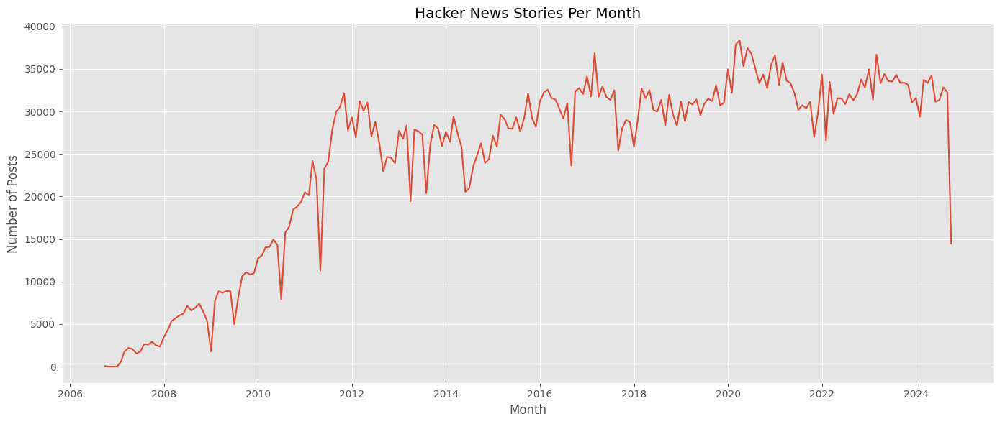

In [14]:
query = """
SELECT 
  DATE_TRUNC('month', time) AS month,
  COUNT(*) AS post_count
FROM hacker_news.items
WHERE type = 'story'
  AND time BETWEEN '2006-10-09 19:21:51' AND '2024-10-14 00:00:50'
GROUP BY month
ORDER BY month;
"""
df = pd.read_sql(query, engine)

df['month'] = pd.to_datetime(df['month'])
df.set_index('month', inplace=True)

# Reindex with a complete monthly range
full_range = pd.date_range(start='2006-10-01', end='2024-10-01', freq='MS')
df = df.reindex(full_range, fill_value=0)

# Plot
plt.figure(figsize=(14, 6))
plt.plot(df.index, df['post_count'])
plt.title("Hacker News Stories Per Month")
plt.xlabel("Month")
plt.ylabel("Number of Posts")
plt.tight_layout()
plt.grid(True)
plt.show()


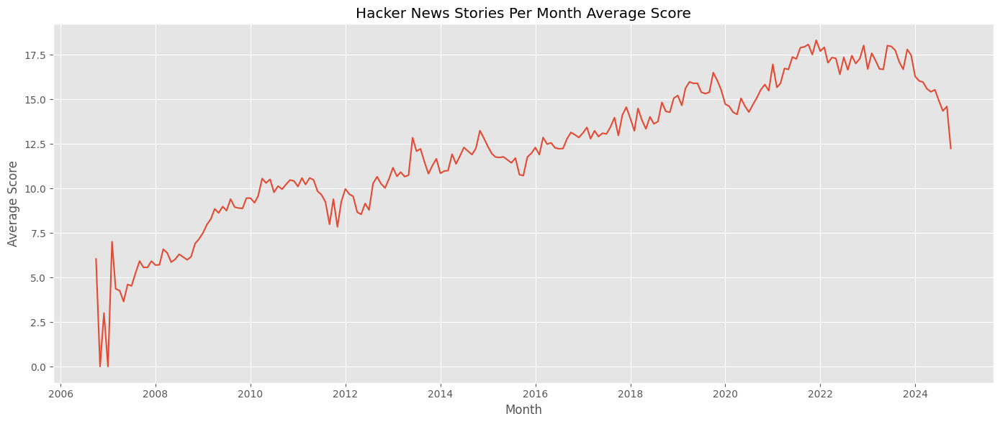

In [17]:
query = """
SELECT 
  DATE_TRUNC('month', time) AS month,
  AVG(score) AS score_average
FROM hacker_news.items
WHERE type = 'story'
  AND time BETWEEN '2006-10-09 19:21:51' AND '2024-10-14 00:00:50'
GROUP BY month
ORDER BY month;
"""
df = pd.read_sql(query, engine)

df['month'] = pd.to_datetime(df['month'])
df.set_index('month', inplace=True)

# Reindex with a complete monthly range
full_range = pd.date_range(start='2006-10-01', end='2024-10-01', freq='MS')
df = df.reindex(full_range, fill_value=0)

# Plot
plt.figure(figsize=(14, 6))
plt.plot(df.index, df['score_average'])
plt.title("Hacker News Stories Per Month Average Score")
plt.xlabel("Month")
plt.ylabel("Average Score")
plt.tight_layout()
plt.grid(True)
plt.show()


In [8]:
bins = [
    (1, 2, '1-2'),
    (3, 5, '3-5'),
    (6, 10, '6-10'),
    (11, 20, '11-20'),
    (21, 50, '21-50'),
    (51, 100, '51-100'),
    (101, 200, '101-200'),
    (201, 500, '201-500'),
    (501, 1000000, '500+')
]
bin_labels = [label for _, _, label in bins]

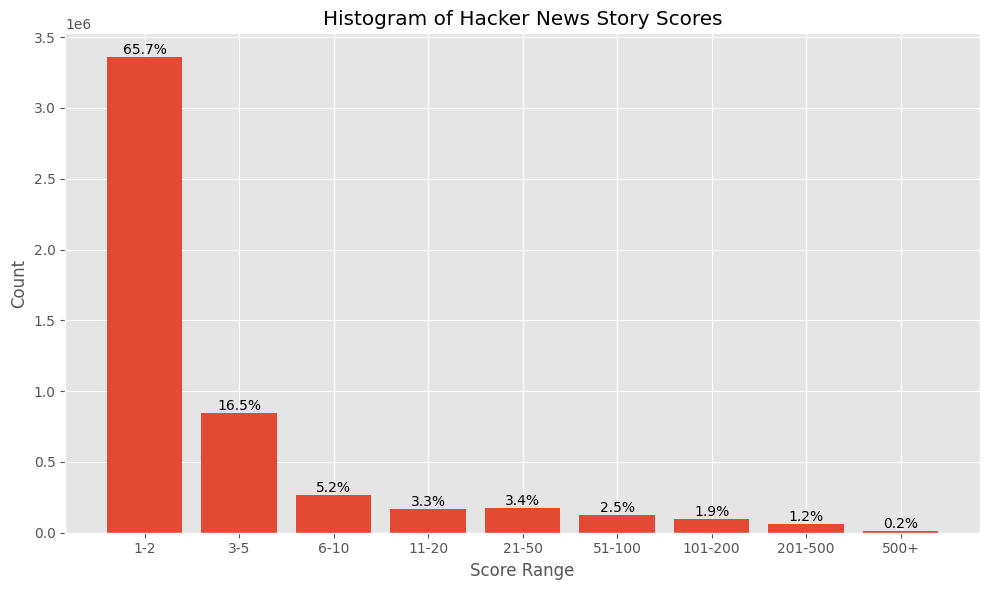

In [16]:
query = """
WITH bins AS (
    SELECT * FROM (VALUES
        {}
    ) AS bin(min_score, max_score, label)
)
SELECT
  b.label AS score_range,
  COUNT(*) AS count,
  100.0 * COUNT(*) / SUM(COUNT(*)) OVER () AS percentage
FROM hacker_news.items i
JOIN bins b ON i.score BETWEEN b.min_score AND b.max_score
WHERE i.type = 'story' AND i.score IS NOT NULL
GROUP BY b.label
ORDER BY MIN(b.min_score);
""".format(
    ',\n        '.join(
        f"({lo}, {hi}, '{label}')" for lo, hi, label in bins
    )
)
df = pd.read_sql(query, engine)

# After fetching data into a DataFrame called df
df['score_range'] = pd.Categorical(df['score_range'], [label for _, _, label in bins], ordered=True)
df = df.sort_values('score_range')

plt.figure(figsize=(10, 6))
bars = plt.bar(df['score_range'], df['count'])

for bar, pct in zip(bars, df['percentage']):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{pct:.1f}%", 
             ha='center', va='bottom')

plt.xlabel("Score Range")
plt.ylabel("Count")
plt.title("Histogram of Hacker News Story Scores ALL TIME")
plt.tight_layout()
plt.show()



In [18]:
start_date = datetime(2006, 10, 1)
end_date = datetime(2024, 10, 1)
intervals = []
current = start_date
while current < end_date:
    next_date = current + relativedelta(months=6)
    intervals.append((current, next_date))
    current = next_date

# Base SQL with escaped {start} and {end}
query_template = """
WITH bins AS (
    SELECT * FROM (VALUES
        {}
    ) AS bin(min_score, max_score, label)
)
SELECT
  b.label AS score_range,
  COUNT(*) AS count
FROM hacker_news.items i
JOIN bins b ON i.score BETWEEN b.min_score AND b.max_score
WHERE i.type = 'story' AND i.score IS NOT NULL
  AND i.time BETWEEN '{{start}}' AND '{{end}}'
GROUP BY b.label
ORDER BY MIN(b.min_score);
""".format(
    ',\n        '.join(
        f"({lo}, {hi}, '{label}')" for lo, hi, label in bins
    )
)

# Collect data for 3D plotting
z_data = []
y_labels = []

for start, end in intervals:
    query = query_template.format(start=start.strftime("%Y-%m-%d"), end=end.strftime("%Y-%m-%d"))
    df = pd.read_sql(query, engine)

    # Ensure all bins are present
    df.set_index('score_range', inplace=True)
    df = df.reindex(bin_labels, fill_value=0)

    z_data.append(df['count'].values)
    y_labels.append(start.strftime('%Y-%m'))

# Convert to array for plotting
z = np.array(z_data)  # Shape: (num_time_periods, num_score_bins)
x = np.arange(len(bin_labels))
y = np.arange(len(y_labels))
X, Y = np.meshgrid(x, y)


/tmp/ipykernel_564644/506265868.py:76: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


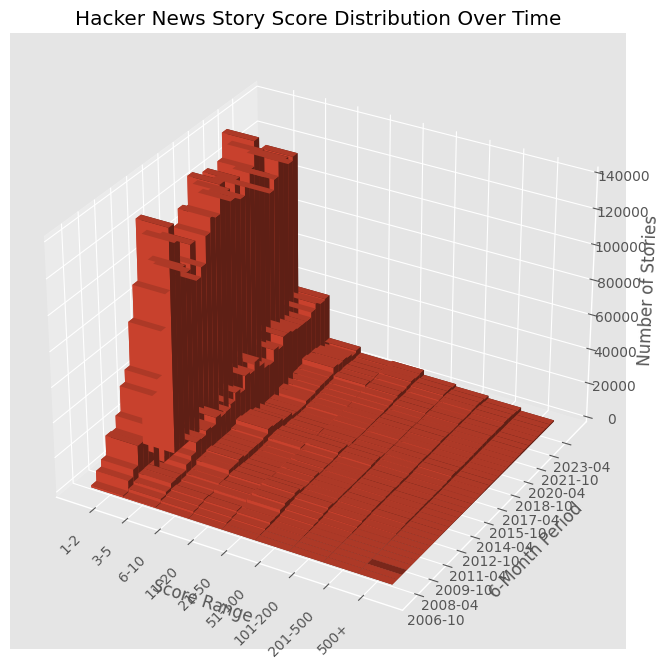

In [31]:

# Plotting
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot bars
ax.bar3d(X.ravel(), Y.ravel(), np.zeros_like(z).ravel(), 1, 1, z.ravel(), shade=True)

# Axes labels
ax.set_xticks(x + 0.5)
ax.set_xticklabels(bin_labels, rotation=45, ha='right')

# Reduce clutter by only showing ~12 y-ticks (e.g. 1 per year)
step = max(1, len(y_labels) // 12)
yticks = np.arange(0, len(y_labels), step)
ax.set_yticks(yticks + 0.5)
ax.set_yticklabels([y_labels[i] for i in yticks], rotation=0)


ax.set_xlabel("Score Range")
ax.set_ylabel("6-Month Period")
ax.set_zlabel("Number of Stories")
ax.set_title("Hacker News Story Score Distribution Over Time")

plt.tight_layout()
plt.show()

In [37]:
fig = go.Figure(data=go.Heatmap(
    z=z,
    x=bin_labels,
    y=y_labels,
    colorscale='Viridis'
))

fig.update_layout(
    title='Heatmap of Hacker News Scores Over Time',
    xaxis_title='Score Range',
    yaxis_title='6-Month Period',
    height=800
)

fig.show()


In [39]:
import plotly.graph_objects as go
import numpy as np

# z: shape (n_intervals, n_score_bins)
z = np.array(z_data)
x = np.arange(len(bin_labels))  # score range indices
y = np.arange(len(y_labels))    # time range indices

fig = go.Figure(data=[go.Surface(
    z=z,
    x=x,
    y=y,
    colorscale='Viridis'
)])

step = max(1, len(y_labels) // 12)

fig.update_layout(
    title='Interactive 3D Score Distribution Surface',
    scene=dict(
        xaxis=dict(title='Score Range', tickvals=x, ticktext=bin_labels),
        yaxis=dict(title='6-Month Period',
                   tickvals=y[::step],
                   ticktext=[y_labels[i] for i in y[::step]]),
        zaxis=dict(title='Number of Stories')
    ),
    height=700
)


fig.show()

In [19]:
query = """
SELECT 
    SUBSTRING(url FROM '(?:https?://)?(?:www\\.)?([^/]+)') AS domain,
    COUNT(*) AS count,
    AVG(score) AS avg_score
FROM 
    hacker_news.items
WHERE 
    type = 'story'
    AND url IS NOT NULL
    AND score IS NOT NULL
GROUP BY 
    domain
HAVING 
    COUNT(*) > 10
ORDER BY 
    avg_score DESC
LIMIT 100;
"""

df = pd.read_sql(query, engine)
display(df)


,domain,count,avg_score
0,ciechanow.ski,63,444.06
1,dkb.io,12,377.67
2,phind.com,13,355.23
3,bugs.xdavidhu.me,11,354.64
4,learningmusic.ableton.com,14,347.50
5,oimo.io,23,341.74
6,intuitiveexplanations.com,15,331.60
7,susanjfowler.com,18,302.22
8,asahilinux.org,25,278.00
9,tinyprojects.dev,20,265.35


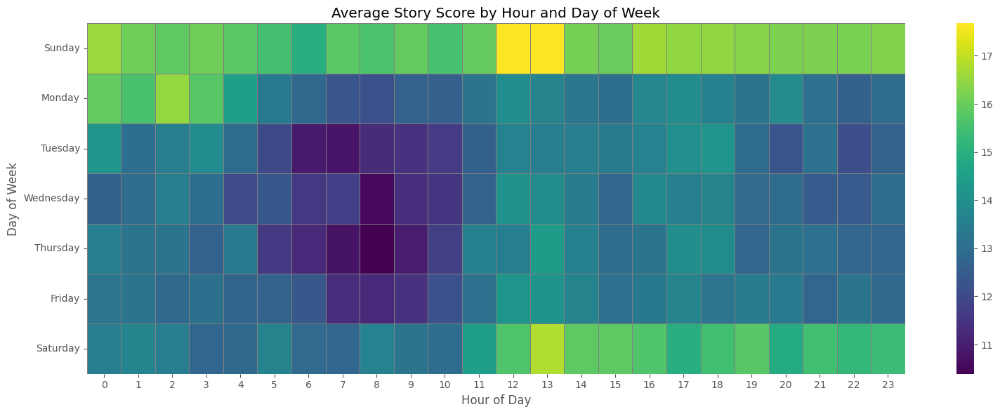

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Run the query
query = """
SELECT
   EXTRACT(DOW FROM time) AS weekday,
    EXTRACT(HOUR FROM time) AS hour,
    AVG(score) AS avg_score
FROM 
    hacker_news.items
WHERE
    type = 'story'
    AND score IS NOT NULL
    AND time IS NOT NULL
GROUP BY
    weekday, hour
ORDER BY
    weekday, hour;
"""

df = pd.read_sql(query, engine)

# Optional: convert weekday numbers to names
weekday_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
df['weekday'] = df['weekday'].astype(int).map(dict(enumerate(weekday_names)))
df['hour'] = df['hour'].astype(int)

# Pivot to get a matrix for heatmap
pivot = df.pivot(index='weekday', columns='hour', values='avg_score')

# Order the days
pivot = pivot.reindex(weekday_names)

# Plot
plt.figure(figsize=(16, 6))
sns.heatmap(pivot, cmap='viridis', linewidths=0.5, linecolor='gray', annot=False)
plt.title('Average Story Score by Hour and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()


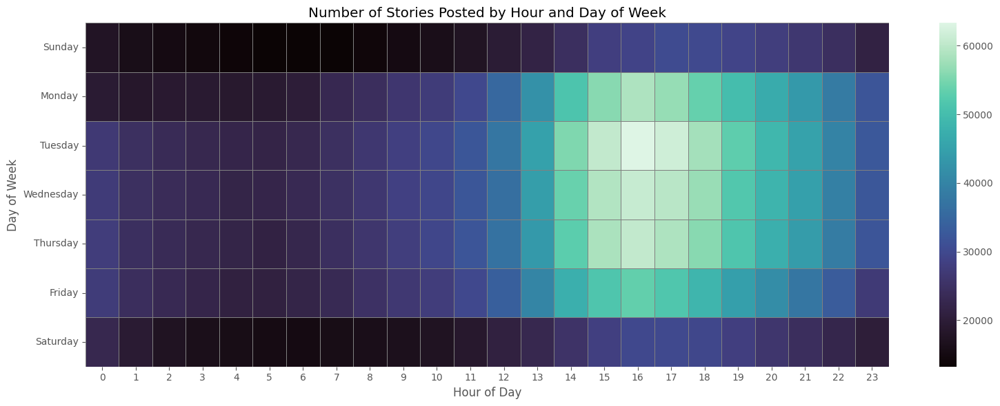

In [22]:
query = """
SELECT
    EXTRACT(DOW FROM time) AS weekday,
    EXTRACT(HOUR FROM time) AS hour,
    COUNT(*) AS post_count
FROM 
    hacker_news.items
WHERE
    type = 'story'
    AND time IS NOT NULL
GROUP BY
    weekday, hour
ORDER BY
    weekday, hour;
"""

df = pd.read_sql(query, engine)

# Clean up and map weekdays
weekday_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
df['weekday'] = df['weekday'].astype(int).map(dict(enumerate(weekday_names)))
df['hour'] = df['hour'].astype(int)

# Pivot
pivot = df.pivot(index='weekday', columns='hour', values='post_count')
pivot = pivot.reindex(weekday_names)

# Plot
plt.figure(figsize=(16, 6))
sns.heatmap(pivot, cmap='mako', linewidths=0.5, linecolor='gray', annot=False)
plt.title('Number of Stories Posted by Hour and Day of Week')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()


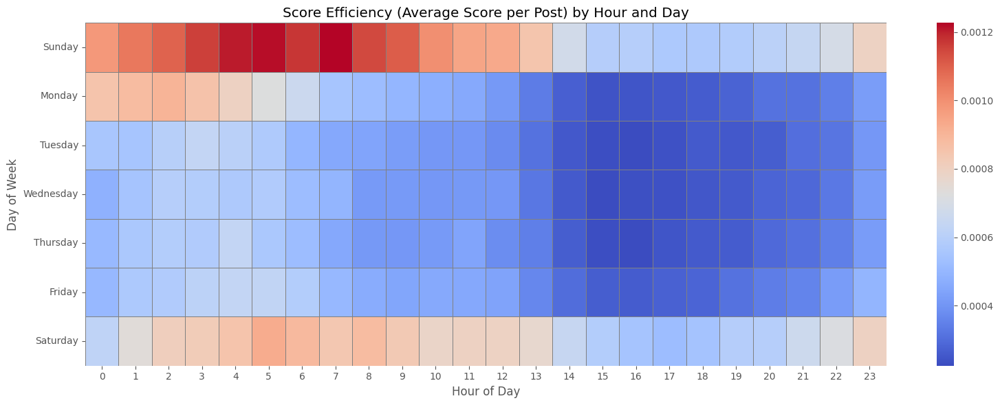

In [23]:
query = """
SELECT
    EXTRACT(DOW FROM time) AS weekday,
    EXTRACT(HOUR FROM time) AS hour,
    COUNT(*) AS post_count,
    AVG(score) AS avg_score
FROM 
    hacker_news.items
WHERE
    type = 'story'
    AND score IS NOT NULL
    AND time IS NOT NULL
GROUP BY
    weekday, hour
ORDER BY
    weekday, hour;
"""

df = pd.read_sql(query, engine)

# Map weekday numbers to names
weekday_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
df['weekday'] = df['weekday'].astype(int).map(dict(enumerate(weekday_names)))
df['hour'] = df['hour'].astype(int)

# Compute "efficiency": avg_score / post_count (optional: scale or normalise)
df['efficiency'] = df['avg_score'] / df['post_count']

# Pivot to heatmap format
pivot = df.pivot(index='weekday', columns='hour', values='efficiency')
pivot = pivot.reindex(weekday_names)

# Plot
plt.figure(figsize=(16, 6))
sns.heatmap(pivot, cmap='coolwarm', linewidths=0.5, linecolor='gray', annot=False)
plt.title('Score Efficiency (Average Score per Post) by Hour and Day')
plt.xlabel('Hour of Day')
plt.ylabel('Day of Week')
plt.tight_layout()
plt.show()


In [ ]:
#when it is quieter perhaps you are more likely to get better scores


KeyboardInterrupt: 

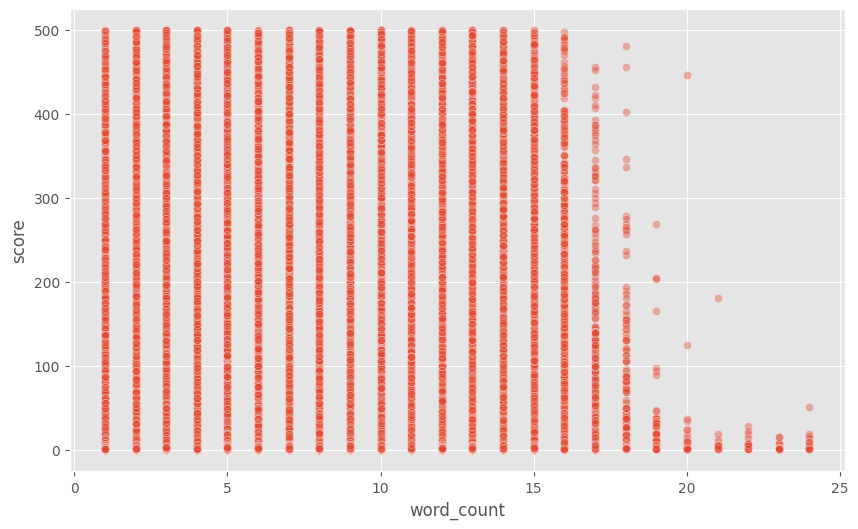

In [24]:
query = """
SELECT
    LENGTH(REGEXP_REPLACE(title, '\\s+', ' ', 'g')) - 
    LENGTH(REPLACE(REGEXP_REPLACE(title, '\\s+', ' ', 'g'), ' ', '')) + 1 AS word_count,
    score
FROM 
    hacker_news.items
WHERE
    type = 'story'
    AND title IS NOT NULL
    AND score IS NOT NULL;
"""

df = pd.read_sql(query, engine)

# Optional: filter out extreme outliers
df = df[(df['word_count'] < 25) & (df['score'] < 500)]

# Scatterplot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='word_count', y='score', data=df, alpha=0.4)
sns.regplot(x='word_count', y='score', data=df, scatter=False, color='red')
plt.title('Hacker News Story Score vs Title Length (in words)')
plt.xlabel('Title Word Count')
plt.ylabel('Score')
plt.tight_layout()
plt.show()

# Correlation coefficient
correlation = df['word_count'].corr(df['score'])
print(f"Correlation between title length and score: {correlation:.3f}")
